## Deepfake Image Detection (Advanced Project)
**Dataset: 50k Real / 50k Fake**

**Models: ResNet18, EfficientNet, Xception**
**Features:**
- Explainable AI (GradCAM)
- Frequency Domain Analysis
- Robustness Testing
- Cross Dataset Evaluation

In [ ]:
!pip install timm
!pip install grad-cam
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 71.5 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44285 sha256=198c0504b46445a6fab42a5c4dc714462679787d4310b36016c64051a85249d1
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 26.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=7ec2b856e4405ff45f13c1fd70cdcf5a778410ced5f07e4f43b9d6a70fad1072
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


# IMPORTING ALL LIBRARIES

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torchvision
import torchvision.transforms as transforms
from torchvision import datasets
from torch.utils.data import DataLoader

import timm
import cv2
from PIL import Image

from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

from tqdm import tqdm

In [ ]:
# CHECKING GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)

Device: cpu


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/drive/MyDrive/DeepDetect/celebDF.zip" -d "/content/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/Celeb_V2/Val/real/00007_face_431.jpg  
  inflating: /content/Celeb_V2/Val/real/00007_face_432.jpg  
  inflating: /content/Celeb_V2/Val/real/00007_face_433.jpg  
  inflating: /content/Celeb_V2/Val/real/00007_face_434.jpg  
  inflating: /content/Celeb_V2/Val/real/00007_face_443.jpg  
  inflating: /content/Celeb_V2/Val/real/00008_face_481.jpg  
  inflating: /content/Celeb_V2/Val/real/00008_face_512.jpg  
  inflating: /content/Celeb_V2/Val/real/00009_face_516.jpg  
  inflating: /content/Celeb_V2/Val/real/00009_face_517.jpg  
  inflating: /content/Celeb_V2/Val/real/00009_face_528.jpg  
  inflating: /content/Celeb_V2/Val/real/00009_face_530.jpg  
  inflating: /content/Celeb_V2/Val/real/00009_face_532.jpg  
  inflating: /content/Celeb_V2/Val/real/00009_face_535.jpg  
  inflating: /content/Celeb_V2/Val/real/00009_face_545.jpg  
  inflating: /content/Celeb_V2/Val/real/00009_face_546.jpg  
  inflating: /content/Celeb_V2/Val

In [ ]:
train_path = "/content/Celeb_V2/Train"
val_path   = "/content/Celeb_V2/Val"
test_path = "/content/Celeb_V2/Test"

In [ ]:
# verifying paths
import os

print("Train Classes:", os.listdir(train_path))
print("Validation Classes:", os.listdir(val_path))
print("Test Classes:", os.listdir(test_path))

Train Classes: ['real', 'fake']
Validation Classes: ['real', 'fake']
Test Classes: ['real', 'fake']


In [ ]:
import os

fake_count = len(os.listdir(train_path + "/fake"))
real_count = len(os.listdir(train_path + "/real"))

print("Dataset Summary")
print("----------------")
print("Fake Images :", fake_count)
print("Real Images :", real_count)
print("Total Images:", fake_count + real_count)

Dataset Summary
----------------
Fake Images : 40536
Real Images : 40288
Total Images: 80824


#Training ResNet18

In [ ]:
import torchvision.models as models
import torch.nn as nn

# Load pretrained ResNet18
model = models.resnet18(weights="IMAGENET1K_V1")

# Get number of features in last layer
num_features = model.fc.in_features

# Replace classifier
model.fc = nn.Sequential(
    nn.Linear(num_features, 256),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(256, 2)
)

# Move model to GPU
model = model.to(device)

print("Model ready")
print(model.fc)

Model ready
Sequential(
  (0): Linear(in_features=512, out_features=256, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.4, inplace=False)
  (3): Linear(in_features=256, out_features=2, bias=True)
)


In [ ]:
# checking final layer
print(model.fc)

Sequential(
  (0): Linear(in_features=512, out_features=256, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.4, inplace=False)
  (3): Linear(in_features=256, out_features=2, bias=True)
)


#Training EfficientNet

In [ ]:
import torchvision.models as models
import torch.nn as nn

# Load pretrained EfficientNet
model = models.efficientnet_b0(pretrained=True)

# Get number of features in classifier
num_features = model.classifier[1].in_features

# Replace classifier
model.classifier = nn.Sequential(
    nn.Linear(num_features, 256),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(256, 2)
)

# Move model to GPU
model = model.to(device)

print("EfficientNet Model ready")
print(model.classifier)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B0_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 126MB/s]


EfficientNet Model ready
Sequential(
  (0): Linear(in_features=1280, out_features=256, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.4, inplace=False)
  (3): Linear(in_features=256, out_features=2, bias=True)
)


In [ ]:
#Loss function & optimizer
optimizer = torch.optim.Adam(
    model.classifier.parameters(),
    lr=0.001
)

In [ ]:
#Data Transforms
import torchvision.transforms as transforms

IMG_SIZE = 224

train_transforms = transforms.Compose([

    transforms.Resize((224,224)),

    transforms.RandomHorizontalFlip(),

    transforms.RandomRotation(10),

    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),

    transforms.RandomResizedCrop(
        224,
        scale=(0.8,1.0)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485,0.456,0.406],
        std=[0.229,0.224,0.225]
    )
])

In [ ]:
# TEST / VALIDATION TRANSFORMS
test_transforms = transforms.Compose([

    transforms.Resize((224,224)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485,0.456,0.406],
        std=[0.229,0.224,0.225]
    )
])

In [ ]:
# DATASET OBJECTS
from torchvision import datasets

train_dataset = datasets.ImageFolder(
    train_path,
    transform=train_transforms
)

val_dataset = datasets.ImageFolder(
    val_path,
    transform=test_transforms
)

test_dataset = datasets.ImageFolder(
    test_path,
    transform=test_transforms
)

print("Train size:", len(train_dataset))
print("Validation size:", len(val_dataset))
print("Test size:", len(test_dataset))

Train size: 80824
Validation size: 10104
Test size: 10103


In [ ]:
# DATA LOADERS
from torch.utils.data import DataLoader

BATCH_SIZE = 32

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False
)

print("DataLoaders ready")

DataLoaders ready


In [ ]:
print("Model exists:", model is not None)
print("Train loader exists:", train_loader is not None)
print("Validation loader exists:", val_loader is not None)
print("Device:", device)

Model exists: True
Train loader exists: True
Validation loader exists: True
Device: cuda


In [ ]:
num_epochs = 10

train_losses = []
val_losses = []
train_accs = []
val_accs = []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")

    # ---------------- TRAIN ----------------
    model.train()
    running_loss = 0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total

    # ---------------- VALIDATION ----------------
    model.eval()
    val_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_loss = val_loss / len(val_loader)
    val_acc = 100 * correct / total

    # Store metrics
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)

    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
    print(f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")


Epoch 1/10
Train Loss: 0.5373 | Train Acc: 72.31%
Val Loss: 0.4723 | Val Acc: 76.99%

Epoch 2/10
Train Loss: 0.4921 | Train Acc: 75.69%
Val Loss: 0.4430 | Val Acc: 78.62%

Epoch 3/10
Train Loss: 0.4727 | Train Acc: 76.86%
Val Loss: 0.4174 | Val Acc: 80.33%

Epoch 4/10
Train Loss: 0.4620 | Train Acc: 77.77%
Val Loss: 0.4089 | Val Acc: 80.52%

Epoch 5/10
Train Loss: 0.4492 | Train Acc: 78.28%
Val Loss: 0.3934 | Val Acc: 81.51%

Epoch 6/10
Train Loss: 0.4441 | Train Acc: 78.74%
Val Loss: 0.4004 | Val Acc: 81.25%

Epoch 7/10
Train Loss: 0.4323 | Train Acc: 79.47%
Val Loss: 0.3816 | Val Acc: 82.33%

Epoch 8/10
Train Loss: 0.4263 | Train Acc: 79.87%
Val Loss: 0.3791 | Val Acc: 82.22%

Epoch 9/10
Train Loss: 0.4206 | Train Acc: 80.20%
Val Loss: 0.3686 | Val Acc: 82.83%

Epoch 10/10
Train Loss: 0.4188 | Train Acc: 80.27%
Val Loss: 0.3644 | Val Acc: 83.41%


In [ ]:
torch.save(model.state_dict(), "model_name.pth")

#Training MobileNet

In [ ]:
import torchvision.models as models
import torch.nn as nn

# Load pretrained MobileNet
model = models.mobilenet_v2(pretrained=True)

# Get number of features in classifier
num_features = model.classifier[1].in_features

# Replace classifier
model.classifier = nn.Sequential(
    nn.Linear(num_features, 256),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(256, 2)
)

# Move model to GPU
model = model.to(device)

print("MobileNet Model ready")
print(model.classifier)

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth


100%|██████████| 13.6M/13.6M [00:00<00:00, 112MB/s] 

MobileNet Model ready
Sequential(
  (0): Linear(in_features=1280, out_features=256, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.4, inplace=False)
  (3): Linear(in_features=256, out_features=2, bias=True)
)


# LOSS & OPTIMIZER

In [ ]:
optimizer = torch.optim.Adam(
    model.classifier.parameters(),
    lr=0.001
)

# TRANSFORMS

In [ ]:
import torchvision.transforms as transforms

IMG_SIZE = 224

train_transforms = transforms.Compose([

    transforms.Resize((224,224)),

    transforms.RandomHorizontalFlip(),

    transforms.RandomRotation(10),

    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),

    transforms.RandomResizedCrop(
        224,
        scale=(0.8,1.0)
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485,0.456,0.406],
        std=[0.229,0.224,0.225]
    )
])

In [ ]:
# TEST / VALIDATION TRANSFORMS
test_transforms = transforms.Compose([

    transforms.Resize((224,224)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485,0.456,0.406],
        std=[0.229,0.224,0.225]
    )
])

# DATASET LOADERS

In [ ]:
# DATASET OBJECTS
from torchvision import datasets

train_dataset = datasets.ImageFolder(
    train_path,
    transform=train_transforms
)

val_dataset = datasets.ImageFolder(
    val_path,
    transform=test_transforms
)

test_dataset = datasets.ImageFolder(
    test_path,
    transform=test_transforms
)

print("Train size:", len(train_dataset))
print("Validation size:", len(val_dataset))
print("Test size:", len(test_dataset))

Train size: 80824
Validation size: 10104
Test size: 10103


In [ ]:
# DATA LOADERS
from torch.utils.data import DataLoader

BATCH_SIZE = 32

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False
)

print("DataLoaders ready")

DataLoaders ready


In [ ]:
print("Model exists:", model is not None)
print("Train loader exists:", train_loader is not None)
print("Validation loader exists:", val_loader is not None)
print("Device:", device)

Model exists: True
Train loader exists: True
Validation loader exists: True
Device: cpu


# TRAINING LOOP

In [ ]:
num_epochs = 10

train_losses = []
val_losses = []
train_accs = []
val_accs = []

for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")

    # ---------------- TRAIN ----------------
    model.train()
    running_loss = 0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total

    # ---------------- VALIDATION ----------------
    model.eval()
    val_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    val_loss = val_loss / len(val_loader)
    val_acc = 100 * correct / total

    # Store metrics
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    train_accs.append(train_acc)
    val_accs.append(val_acc)

    print(f"Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%")
    print(f"Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%")


Epoch 1/10


NameError: name 'criterion' is not defined

In [ ]:
torch.save(model.state_dict(), "mobileNet.pth")

NameError: name 'torch' is not defined

#Evaluation of Models

In [ ]:
import torch
import torch.nn as nn
from torchvision import models
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [ ]:
def evaluate_model(model, val_loader, device, model_name):
    model.eval()

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Metrics
    acc = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)

    print(f"\n📊 {model_name} Results:")
    print("Accuracy:", acc)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)

    plt.figure()
    sns.heatmap(cm, annot=True, fmt='d')
    plt.title(f"{model_name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

    return {
        "model": model_name,
        "accuracy": acc,
        "precision": precision,
        "recall": recall,
        "f1_score": f1
    }

In [ ]:
# Load ResNet18
model = models.resnet18(pretrained=False)

num_features = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_features, 256),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(256, 2)
)

PATH = "/content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model.pth"
model.load_state_dict(torch.load(PATH, map_location=device))

# Evaluate
resnet_results = evaluate_model(model, val_loader, device, "ResNet18")

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


KeyboardInterrupt: 

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)



📊 EfficientNet Results:
Accuracy: 0.8341250989707046
Precision: 0.8420195439739414
Recall: 0.8212867355043686
F1 Score: 0.8315239244069159


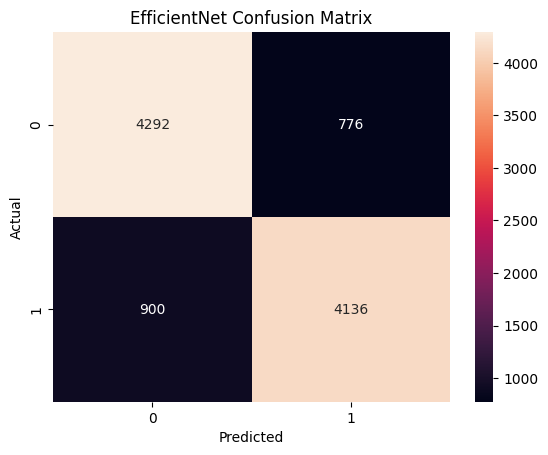

In [ ]:
model = models.efficientnet_b0(pretrained=False)

num_features = model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Linear(num_features, 256),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(256, 2)
)

PATH = "/content/drive/MyDrive/DeepDetect/efficientNet.pth"
model.load_state_dict(torch.load(PATH, map_location=device))

# Evaluate
efficientnet_results = evaluate_model(model, val_loader, device, "EfficientNet")


📊 MobileNet Results:
Accuracy: 0.735055423594616
Precision: 0.7035375323554789
Recall: 0.8095710881652105
F1 Score: 0.7528390730311144


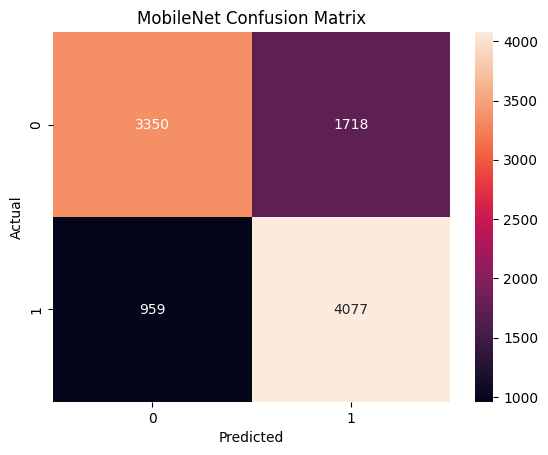

In [ ]:
model = models.mobilenet_v2(pretrained=False)

num_features = model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Linear(num_features, 256),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(256, 2)
)

PATH = "/content/drive/MyDrive/DeepDetect/mobileNet.pth"
model.load_state_dict(torch.load("mobilenet.pth"))
model = model.to(device)

# Evaluate
mobilenet_results = evaluate_model(model, val_loader, device, "MobileNet")

In [ ]:
# Define resnet results properly
resnet_results = {
    "model": "ResNet18",
    "accuracy": 0.99396,
    "precision": 0.995024,
    "recall": 0.9928514,
    "f1_score": 0.993936
}

efficientnet_results = {
    "model": "EfficientNet",
    "accuracy": 0.8341250989707046,
    "precision": 0.8420195439739414,
    "recall": 0.8212867355043686,
    "f1_score": 0.8315239244069159
}

mobilenet_results = {
    "model": "EfficientNet",
    "accuracy": 0.735055423594616,
    "precision": 0.7035375323554789,
    "recall": 0.8095710881652105,
    "f1_score": 0.7528390730311144
}

# Combine results
results = [
    resnet_results,
    efficientnet_results,
    mobilenet_results
]

# Create DataFrame
import pandas as pd
df = pd.DataFrame(results)

print(df)

          model  accuracy  precision    recall  f1_score
0      ResNet18  0.993960   0.995024  0.992851  0.993936
1  EfficientNet  0.834125   0.842020  0.821287  0.831524
2  EfficientNet  0.735055   0.703538  0.809571  0.752839


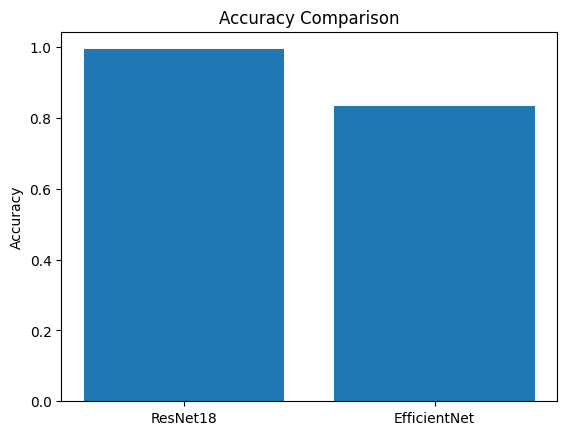

In [ ]:
#accuracy comparison
plt.figure()
plt.bar(df["model"], df["accuracy"])
plt.title("Accuracy Comparison")
plt.ylabel("Accuracy")
plt.show()

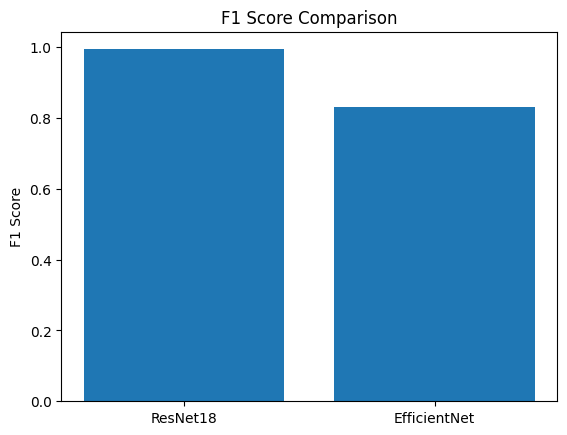

In [ ]:
#f1 score comparison
plt.figure()
plt.bar(df["model"], df["f1_score"])
plt.title("F1 Score Comparison")
plt.ylabel("F1 Score")
plt.show()

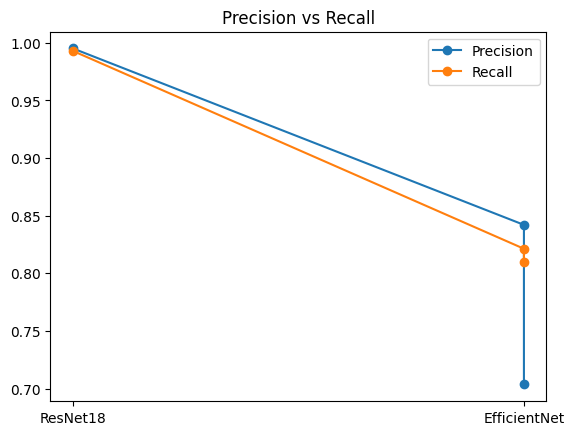

In [ ]:
#Precision & Recall
plt.figure()
plt.plot(df["model"], df["precision"], marker='o', label="Precision")
plt.plot(df["model"], df["recall"], marker='o', label="Recall")
plt.legend()
plt.title("Precision vs Recall")
plt.show()

In [ ]:
# Best Model
best_model = df.sort_values("accuracy", ascending=False).iloc[0]
print("Best Model:\n", best_model)

Best Model:
 model        ResNet18
accuracy      0.99396
precision    0.995024
recall       0.992851
f1_score     0.993936
Name: 0, dtype: object


In [ ]:
import json

results = df.to_dict(orient="records")

with open("results.json", "w") as f:
    json.dump(results, f)

#Below old ResNet18

In [ ]:
import os

checkpoint_dir = "/content/drive/MyDrive/DeepDetect/deepfake_checkpoints"

os.makedirs(checkpoint_dir, exist_ok=True)

print("Checkpoint directory ready:", checkpoint_dir)

Checkpoint directory ready: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints


In [ ]:
# Training parameters
EPOCHS = 10

In [ ]:
from tqdm import tqdm
import torch

best_val_acc = 0

train_losses = []
val_losses = []
train_accs = []
val_accs = []

for epoch in range(EPOCHS):

    # -----------------------------
    # TRAINING
    # -----------------------------

    model.train()

    running_loss = 0
    correct = 0
    total = 0

    progress_bar = tqdm(train_loader)

    for images, labels in progress_bar:

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = criterion(outputs, labels)

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

        _, preds = torch.max(outputs, 1)

        total += labels.size(0)
        correct += (preds == labels).sum().item()

        progress_bar.set_description(f"Epoch {epoch+1}/{EPOCHS}")

    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total

    train_losses.append(train_loss)
    train_accs.append(train_acc)

    # -----------------------------
    # VALIDATION
    # -----------------------------

    model.eval()

    val_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():

        for images, labels in val_loader:

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)

            loss = criterion(outputs, labels)

            val_loss += loss.item()

            _, preds = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (preds == labels).sum().item()

    val_loss = val_loss / len(val_loader)
    val_acc = 100 * correct / total

    val_losses.append(val_loss)
    val_accs.append(val_acc)

    scheduler.step(val_loss)

    # -----------------------------
    # PRINT RESULTS
    # -----------------------------

    print("\nEpoch:", epoch+1)
    print("Train Loss:", round(train_loss,4))
    print("Train Accuracy:", round(train_acc,2), "%")
    print("Val Loss:", round(val_loss,4))
    print("Val Accuracy:", round(val_acc,2), "%")

    # -----------------------------
    # SAVE CHECKPOINT
    # -----------------------------

    checkpoint_path = f"{checkpoint_dir}/resnet_epoch_{epoch+1}.pth"

    torch.save({
        'epoch': epoch + 1,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_loss': train_loss,
        'val_loss': val_loss
    }, checkpoint_path)

    print("Checkpoint saved:", checkpoint_path)

    # -----------------------------
    # SAVE BEST MODEL
    # -----------------------------

    if val_acc > best_val_acc:

        best_val_acc = val_acc

        best_model_path = f"{checkpoint_dir}/best_resnet_model.pth"

        torch.save(model.state_dict(), best_model_path)

        print("🔥 Best model updated:", best_model_path)

Epoch 1/10: 100%|██████████| 2526/2526 [09:04<00:00,  4.64it/s]



Epoch: 1
Train Loss: 0.184
Train Accuracy: 92.46 %
Val Loss: 0.0721
Val Accuracy: 97.35 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_1.pth
🔥 Best model updated: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model.pth


Epoch 2/10: 100%|██████████| 2526/2526 [08:34<00:00,  4.91it/s]



Epoch: 2
Train Loss: 0.101
Train Accuracy: 96.21 %
Val Loss: 0.0991
Val Accuracy: 96.08 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_2.pth


Epoch 3/10: 100%|██████████| 2526/2526 [08:29<00:00,  4.96it/s]



Epoch: 3
Train Loss: 0.078
Train Accuracy: 97.1 %
Val Loss: 0.0653
Val Accuracy: 97.65 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_3.pth
🔥 Best model updated: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model.pth


Epoch 4/10: 100%|██████████| 2526/2526 [08:22<00:00,  5.03it/s]



Epoch: 4
Train Loss: 0.0664
Train Accuracy: 97.64 %
Val Loss: 0.0453
Val Accuracy: 98.41 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_4.pth
🔥 Best model updated: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model.pth


Epoch 5/10: 100%|██████████| 2526/2526 [08:21<00:00,  5.03it/s]



Epoch: 5
Train Loss: 0.0548
Train Accuracy: 98.01 %
Val Loss: 0.0565
Val Accuracy: 97.84 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_5.pth


Epoch 6/10: 100%|██████████| 2526/2526 [08:23<00:00,  5.02it/s]



Epoch: 6
Train Loss: 0.0492
Train Accuracy: 98.18 %
Val Loss: 0.0437
Val Accuracy: 98.36 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_6.pth


Epoch 7/10: 100%|██████████| 2526/2526 [08:24<00:00,  5.01it/s]



Epoch: 7
Train Loss: 0.0442
Train Accuracy: 98.41 %
Val Loss: 0.035
Val Accuracy: 98.58 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_7.pth
🔥 Best model updated: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model.pth


Epoch 8/10: 100%|██████████| 2526/2526 [08:20<00:00,  5.05it/s]



Epoch: 8
Train Loss: 0.0402
Train Accuracy: 98.56 %
Val Loss: 0.0337
Val Accuracy: 98.88 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_8.pth
🔥 Best model updated: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model.pth


Epoch 9/10: 100%|██████████| 2526/2526 [08:26<00:00,  4.99it/s]



Epoch: 9
Train Loss: 0.0368
Train Accuracy: 98.67 %
Val Loss: 0.0232
Val Accuracy: 99.18 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_9.pth
🔥 Best model updated: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model.pth


Epoch 10/10: 100%|██████████| 2526/2526 [08:24<00:00,  5.01it/s]



Epoch: 10
Train Loss: 0.0336
Train Accuracy: 98.81 %
Val Loss: 0.0188
Val Accuracy: 99.4 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_10.pth
🔥 Best model updated: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model.pth


In [ ]:
# total number of model parameters
total_params = sum(p.numel() for p in model.parameters())

print("Total model parameters:", total_params)

Total model parameters: 11308354


In [ ]:
# LOAD THE BEST MODEL
best_model_path = "/content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model.pth"

model.load_state_dict(torch.load(best_model_path))
model.eval()

print("Best model loaded successfully")

Best model loaded successfully


In [ ]:
# RUNNING MODEL ON TEST DATASET
all_preds = []
all_labels = []
all_probs = []

with torch.no_grad():

    for images, labels in test_loader:

        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)

        probs = torch.softmax(outputs, dim=1)

        _, preds = torch.max(outputs, 1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(probs[:,1].cpu().numpy())

print("Prediction complete")

KeyboardInterrupt: 

In [ ]:
# CLASSIFICATION REPORT
from sklearn.metrics import classification_report

print(classification_report(
    all_labels,
    all_preds,
    target_names=["Fake","Real"]
))

              precision    recall  f1-score   support

        Fake       0.99      0.99      0.99      5067
        Real       0.99      0.99      0.99      5036

    accuracy                           0.99     10103
   macro avg       0.99      0.99      0.99     10103
weighted avg       0.99      0.99      0.99     10103



In [ ]:
!pip install seaborn

# CONFUSION MATRIX

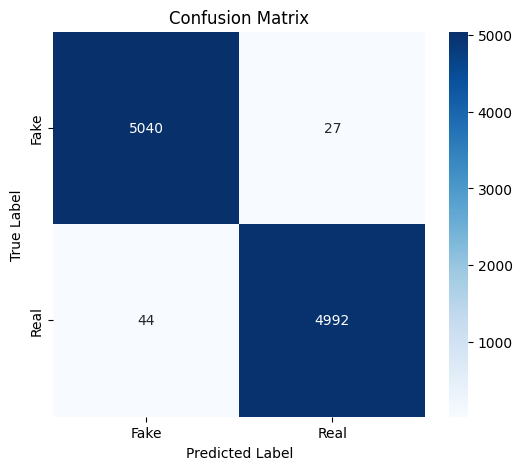

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(all_labels, all_preds)

plt.figure(figsize=(6,5))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=["Fake","Real"],
    yticklabels=["Fake","Real"]
)

plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")

plt.show()

# ROC CURVE + AUC

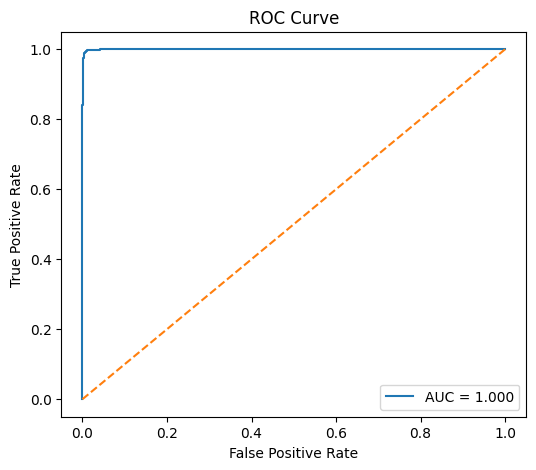

AUC Score: 0.9996943655571342


In [ ]:
from sklearn.metrics import roc_curve, auc

fpr, tpr, _ = roc_curve(all_labels, all_probs)

roc_auc = auc(fpr, tpr)

plt.figure(figsize=(6,5))

plt.plot(fpr, tpr, label=f"AUC = {roc_auc:.3f}")

plt.plot([0,1],[0,1],'--')

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")

plt.legend()

plt.show()

print("AUC Score:", roc_auc)

In [ ]:
from sklearn.metrics import accuracy_score

test_accuracy = accuracy_score(all_labels, all_preds)

print("Test Accuracy:", test_accuracy)

Test Accuracy: 0.9929723844402653


In [ ]:
torch.save(
    model.state_dict(),
    "/content/drive/MyDrive/DeepDetect/deepfake_checkpoints/final_resnet18_model.pth"
)

print("Final model saved")

Final model saved


# GradCAM

Grad-CAM highlights important image regions used by the model.

**For deepfakes, it often focuses on:**
- eyes
- mouth
- face blending boundaries
- skin texture artifacts

You will generate heatmaps overlayed on the face.

In [ ]:
!pip install grad-cam

In [ ]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
# Select Target Layer
# For ResNet18, the best layer is the last convolution layer.
target_layers = [model.layer4[-1]]

In [ ]:
# Image path
image_path = "/content/Celeb_V2/Test/fake/id0_id16_0000_face_6.jpg"

In [ ]:
# Load image
image = cv2.imread(image_path)
image = cv2.resize(image, (224,224))

rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
rgb_image = rgb_image.astype(np.float32) / 255.0

In [ ]:
#Prepare Input Tensor
input_tensor = test_transforms(Image.fromarray(image)).unsqueeze(0).to(device)

In [ ]:
# GENERATE GradCAM Heatmap
cam = GradCAM(model=model, target_layers=target_layers)

targets = None

grayscale_cam = cam(input_tensor=input_tensor, targets=targets)

grayscale_cam = grayscale_cam[0]

Text(0.5, 1.0, 'GradCAM Heatmap')

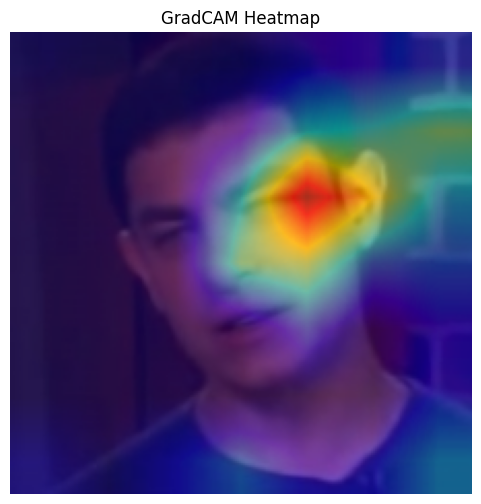

In [ ]:
# Overlay Heatmap on Image
visualization = show_cam_on_image(rgb_image, grayscale_cam, use_rgb=True)

plt.figure(figsize=(6,6))
plt.imshow(visualization)
plt.axis("off")
plt.title("GradCAM Heatmap")

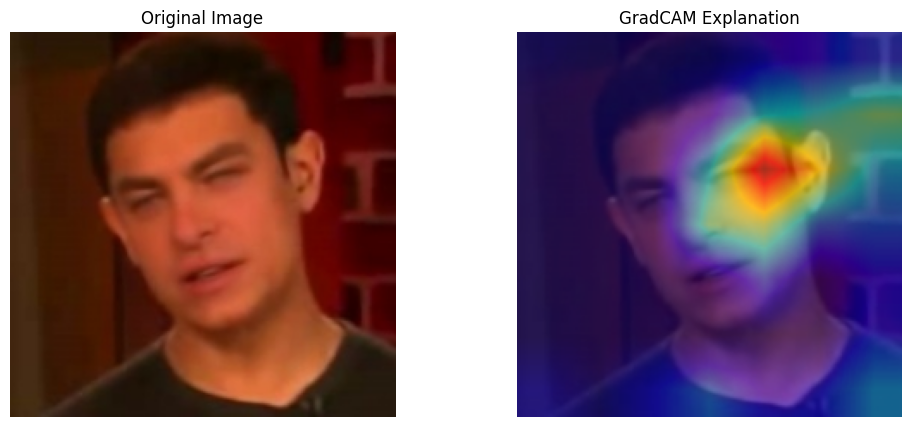

In [ ]:
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.imshow(rgb_image)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(visualization)
plt.title("GradCAM Explanation")
plt.axis("off")

plt.show()

In [ ]:
target_layers = [model.layer4[-1]]

In [ ]:
cam = GradCAM(model=model, target_layers=target_layers)

In [ ]:
def generate_gradcam(image_path):

    image = cv2.imread(image_path)
    image = cv2.resize(image,(224,224))

    rgb_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    rgb_img_float = rgb_img.astype(np.float32) / 255.0

    input_tensor = test_transforms(Image.fromarray(rgb_img)).unsqueeze(0).to(device)

    grayscale_cam = cam(input_tensor=input_tensor)
    grayscale_cam = grayscale_cam[0]

    visualization = show_cam_on_image(rgb_img_float, grayscale_cam, use_rgb=True)

    return rgb_img, visualization

In [ ]:
# SAMPLE IMAGES

fake_dir = "/content/Celeb_V2/Test/fake"
real_dir = "/content/Celeb_V2/Test/real"

fake_images = os.listdir(fake_dir)[:3]
real_images = os.listdir(real_dir)[:3]

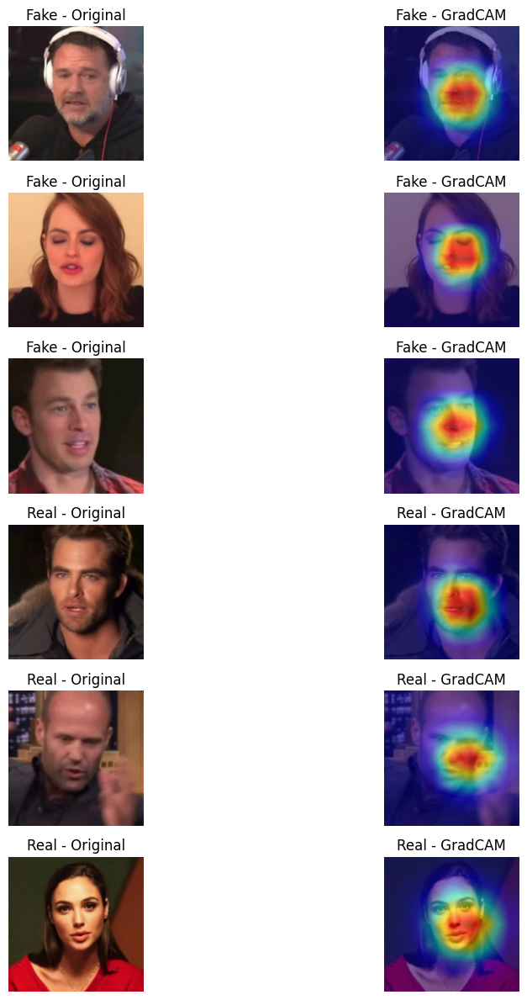

In [ ]:
plt.figure(figsize=(12,12))

index = 1

# Fake Images
for img_name in fake_images:

    img_path = os.path.join(fake_dir, img_name)

    original, gradcam = generate_gradcam(img_path)

    plt.subplot(6,2,index)
    plt.imshow(original)
    plt.title("Fake - Original")
    plt.axis("off")

    plt.subplot(6,2,index+1)
    plt.imshow(gradcam)
    plt.title("Fake - GradCAM")
    plt.axis("off")

    index += 2


# Real Images
for img_name in real_images:

    img_path = os.path.join(real_dir, img_name)

    original, gradcam = generate_gradcam(img_path)

    plt.subplot(6,2,index)
    plt.imshow(original)
    plt.title("Real - Original")
    plt.axis("off")

    plt.subplot(6,2,index+1)
    plt.imshow(gradcam)
    plt.title("Real - GradCAM")
    plt.axis("off")

    index += 2

plt.tight_layout()
plt.show()

# INFERENCE

In [ ]:
best_model_path = "/content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model.pth"

model.load_state_dict(torch.load(best_model_path))
model.eval()

print("Model ready for inference")

Model ready for inference


In [ ]:
import torch
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

class_names = ["Fake", "Real"]

def predict_image(image_path):

    # Load image
    image = cv2.imread(image_path)
    image = cv2.resize(image,(224,224))

    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Transform
    input_tensor = test_transforms(Image.fromarray(rgb_image)).unsqueeze(0).to(device)

    # Prediction
    with torch.no_grad():

        outputs = model(input_tensor)

        probs = torch.softmax(outputs, dim=1)

        confidence, pred = torch.max(probs,1)

    predicted_class = class_names[pred.item()]
    confidence_score = confidence.item()

    # Display
    plt.imshow(rgb_image)
    plt.title(f"Prediction: {predicted_class} ({confidence_score:.3f})")
    plt.axis("off")
    plt.show()

    print("Prediction:", predicted_class)
    print("Confidence:", round(confidence_score*100,2), "%")

    return predicted_class, confidence_score

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving 20231129_115339.jpg to 20231129_115339.jpg


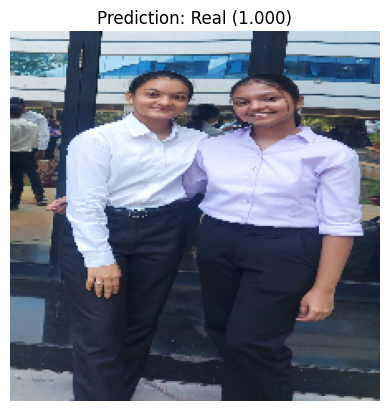

Prediction: Real
Confidence: 99.99 %


('Real', 0.9998841285705566)

In [ ]:
predict_image("20231129_115339.jpg")

In [ ]:
!wget https://thispersondoesnotexist.com/ -O fake_face.jpg

--2026-03-04 16:49:06--  https://thispersondoesnotexist.com/
Resolving thispersondoesnotexist.com (thispersondoesnotexist.com)... 104.21.3.164, 172.67.130.241, 2606:4700:3032::6815:3a4, ...
Connecting to thispersondoesnotexist.com (thispersondoesnotexist.com)|104.21.3.164|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 546636 (534K) [image/jpeg]
Saving to: ‘fake_face.jpg’

fake_face.jpg       100%[===================>] 533.82K   700KB/s    in 0.8s    

2026-03-04 16:49:08 (700 KB/s) - ‘fake_face.jpg’ saved [546636/546636]



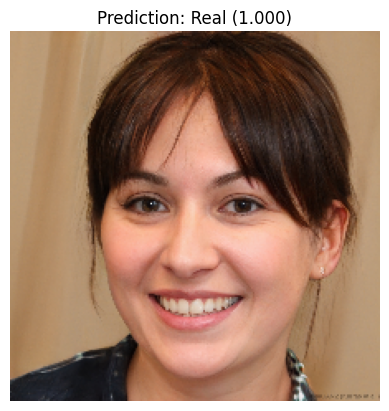

Prediction: Real
Confidence: 100.0 %


('Real', 1.0)

In [ ]:
predict_image("fake_face.jpg")

# FOR MULTIPLE EXTERNAL IMAGES

In [ ]:
def detect_folder(folder_path):

    images = os.listdir(folder_path)

    for img_name in images:

        img_path = os.path.join(folder_path, img_name)

        print("\nProcessing:", img_name)

        predict_image(img_path)

# SYNTHETIC IMAGES

In [ ]:
!pip install kaggle

In [ ]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
!kaggle datasets download -d xhlulu/140k-real-and-fake-faces

Dataset URL: https://www.kaggle.com/datasets/xhlulu/140k-real-and-fake-faces
License(s): other
 99% 3.70G/3.75G [01:22<00:02, 22.9MB/s]
100% 3.75G/3.75G [01:22<00:00, 48.8MB/s]


In [ ]:
!unzip 140k-real-and-fake-faces.zip

Streaming output truncated to the last 5000 lines.
  inflating: real_vs_fake/real-vs-fake/valid/real/34836.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34839.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34847.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34848.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34852.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34861.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34864.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34868.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34877.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34883.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34887.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34891.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34894.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34904.jpg  
  inflating: real_vs_fake/real-vs-fake/valid/real/34905.jpg  
  inflating: real_v

In [ ]:
import os

len(os.listdir("/content/real_vs_fake/real-vs-fake/train/fake"))

50000

# COPY TO MAIN DATASET

In [ ]:
import os
import shutil
import random

source = "/content/real_vs_fake/real-vs-fake/train/fake"
destination = "/content/Celeb_V2/Train/synthetic"

os.makedirs(destination, exist_ok=True)

images = os.listdir(source)

selected_images = random.sample(images, 5000)

for img in selected_images:
    shutil.copy(
        os.path.join(source, img),
        os.path.join(destination, img)
    )

print("Synthetic images added:", len(os.listdir(destination)))

Synthetic images added: 11748


In [ ]:
import os
os.makedirs("/content/Celeb_V2/Train/synthetic", exist_ok=True)
os.makedirs("/content/Celeb_V2/Val/synthetic", exist_ok=True)
os.makedirs("/content/Celeb_V2/Test/synthetic", exist_ok=True)

print("Folders created successfully")

Folders created successfully


In [ ]:
# CREATE VALIDATION AND TEST SPLIT
import random
import shutil
import os

train_dir = "/content/Celeb_V2/Train/synthetic"
val_dir = "/content/Celeb_V2/Val/synthetic"
test_dir = "/content/Celeb_V2/Test/synthetic"

images = os.listdir(train_dir)
random.shuffle(images)

val_size = int(0.1 * len(images))
test_size = int(0.1 * len(images))

val_images = images[:val_size]
test_images = images[val_size:val_size+test_size]

for img in val_images:
    shutil.move(
        os.path.join(train_dir, img),
        os.path.join(val_dir, img)
    )

for img in test_images:
    shutil.move(
        os.path.join(train_dir, img),
        os.path.join(test_dir, img)
    )

print("Synthetic split completed")

Synthetic split completed


In [ ]:
for split in ["Train","Val","Test"]:
    print("\n", split)

    path = f"/content/Celeb_V2/{split}"

    for cls in os.listdir(path):
        print(cls, len(os.listdir(os.path.join(path,cls))))


 Train
real 40288
synthetic 9400
fake 40536

 Val
real 5036
synthetic 1666
fake 5068

 Test
real 5036
synthetic 1670
fake 5067


In [ ]:
import torchvision.models as models
import torch.nn as nn

model = models.resnet18(weights="IMAGENET1K_V1")

num_features = model.fc.in_features

model.fc = nn.Sequential(
    nn.Linear(512,256),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(256,3)
)

model = model.to(device)

print(model.fc)

Sequential(
  (0): Linear(in_features=512, out_features=256, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.4, inplace=False)
  (3): Linear(in_features=256, out_features=3, bias=True)
)


In [ ]:
# LOSS & OPTIMIZER
import torch.optim as optim

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    model.parameters(),
    lr=0.0003
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    patience=2,
    factor=0.3
)

In [ ]:
print(train_dataset.classes)

['fake', 'real', 'synthetic']


In [ ]:
print(train_dataset.class_to_idx)

{'fake': 0, 'real': 1, 'synthetic': 2}


In [ ]:
print(model.fc)

Sequential(
  (0): Linear(in_features=512, out_features=256, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.4, inplace=False)
  (3): Linear(in_features=256, out_features=3, bias=True)
)


In [ ]:
import torch.optim as optim

optimizer = optim.Adam(model.parameters(), lr=0.0003)

In [ ]:
criterion = torch.nn.CrossEntropyLoss()

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

In [ ]:
print(len(train_dataset.classes))

3


In [ ]:
from torchvision import datasets

train_dataset = datasets.ImageFolder(
    train_path,
    transform=train_transforms
)

val_dataset = datasets.ImageFolder(
    val_path,
    transform=test_transforms
)

test_dataset = datasets.ImageFolder(
    test_path,
    transform=test_transforms
)

In [ ]:
print(train_dataset.classes)

['fake', 'real', 'synthetic']


In [ ]:
from torch.utils.data import DataLoader

train_loader = DataLoader(
    train_dataset,
    batch_size=32,
    shuffle=True,
    num_workers=2
)

val_loader = DataLoader(
    val_dataset,
    batch_size=32,
    shuffle=False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=32,
    shuffle=False
)

In [ ]:
# cleaning
from PIL import Image
import os

dataset_path = "/content/Celeb_V2"

bad_images = []

for root, dirs, files in os.walk(dataset_path):
    for file in files:
        path = os.path.join(root, file)
        try:
            img = Image.open(path)
            img.verify()
        except:
            bad_images.append(path)

print("Corrupted images found:", len(bad_images))

Corrupted images found: 1


In [ ]:
for img in bad_images:
    os.remove(img)

print("Corrupted images removed")

Corrupted images removed


In [ ]:
train_dataset = datasets.ImageFolder(train_path, transform=train_transforms)
val_dataset   = datasets.ImageFolder(val_path, transform=test_transforms)
test_dataset  = datasets.ImageFolder(test_path, transform=test_transforms)

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader  = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [ ]:
import os

checkpoint_dir = "/content/drive/MyDrive/DeepDetect/deepfake_checkpoints"

os.makedirs(checkpoint_dir, exist_ok=True)

print("Checkpoint directory ready:", checkpoint_dir)

Checkpoint directory ready: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints


In [ ]:
EPOCHS = 5

In [ ]:
# TRAINING LOOP

from tqdm import tqdm
import torch

best_val_acc = 0

train_losses = []
val_losses = []
train_accs = []
val_accs = []

for epoch in range(EPOCHS):

    # -----------------------------
    # TRAINING
    # -----------------------------

    model.train()

    running_loss = 0
    correct = 0
    total = 0

    progress_bar = tqdm(train_loader)

    for images, labels in progress_bar:

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = criterion(outputs, labels)

        loss.backward()

        optimizer.step()

        running_loss += loss.item()

        _, preds = torch.max(outputs, 1)

        total += labels.size(0)
        correct += (preds == labels).sum().item()

        progress_bar.set_description(f"Epoch {epoch+1}/{EPOCHS}")

    train_loss = running_loss / len(train_loader)
    train_acc = 100 * correct / total

    train_losses.append(train_loss)
    train_accs.append(train_acc)

    # -----------------------------
    # VALIDATION
    # -----------------------------

    model.eval()

    val_loss = 0
    correct = 0
    total = 0

    with torch.no_grad():

        for images, labels in val_loader:

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)

            loss = criterion(outputs, labels)

            val_loss += loss.item()

            _, preds = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (preds == labels).sum().item()

    val_loss = val_loss / len(val_loader)
    val_acc = 100 * correct / total

    val_losses.append(val_loss)
    val_accs.append(val_acc)

    scheduler.step(val_loss)

    # -----------------------------
    # PRINT RESULTS
    # -----------------------------

    print("\nEpoch:", epoch+1)
    print("Train Loss:", round(train_loss,4))
    print("Train Accuracy:", round(train_acc,2), "%")
    print("Val Loss:", round(val_loss,4))
    print("Val Accuracy:", round(val_acc,2), "%")

    # -----------------------------
    # SAVE CHECKPOINT
    # -----------------------------

    checkpoint_path = f"{checkpoint_dir}/resnet_epoch_{epoch+1}.pth"

    torch.save({
        'epoch': epoch + 1,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'train_loss': train_loss,
        'val_loss': val_loss
    }, checkpoint_path)

    print("Checkpoint saved:", checkpoint_path)

    # -----------------------------
    # SAVE BEST MODEL
    # -----------------------------

    if val_acc > best_val_acc:

        best_val_acc = val_acc

        best_model_path = f"{checkpoint_dir}/best_resnet_model_3class.pth"

        torch.save(model.state_dict(), best_model_path)

        print("🔥 Best model updated:", best_model_path)

Epoch 1/5: 100%|██████████| 2820/2820 [10:02<00:00,  4.68it/s]



Epoch: 1
Train Loss: 0.0791
Train Accuracy: 97.06 %
Val Loss: 0.039
Val Accuracy: 98.58 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_1.pth
🔥 Best model updated: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model_3class.pth


Epoch 2/5: 100%|██████████| 2820/2820 [09:58<00:00,  4.71it/s]



Epoch: 2
Train Loss: 0.0664
Train Accuracy: 97.57 %
Val Loss: 0.0637
Val Accuracy: 97.42 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_2.pth


Epoch 3/5: 100%|██████████| 2820/2820 [10:08<00:00,  4.64it/s]



Epoch: 3
Train Loss: 0.0583
Train Accuracy: 97.89 %
Val Loss: 0.048
Val Accuracy: 98.15 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_3.pth


Epoch 4/5: 100%|██████████| 2820/2820 [10:13<00:00,  4.60it/s]



Epoch: 4
Train Loss: 0.0511
Train Accuracy: 98.21 %
Val Loss: 0.0302
Val Accuracy: 98.91 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_4.pth
🔥 Best model updated: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model_3class.pth


Epoch 5/5: 100%|██████████| 2820/2820 [10:11<00:00,  4.62it/s]



Epoch: 5
Train Loss: 0.0439
Train Accuracy: 98.43 %
Val Loss: 0.0325
Val Accuracy: 98.88 %
Checkpoint saved: /content/drive/MyDrive/DeepDetect/deepfake_checkpoints/resnet_epoch_5.pth


In [ ]:
import torch

torch.save(model.state_dict(),
           "/content/drive/MyDrive/DeepDetect/deepfake_resnet18_3class.pth")

print("Model saved successfully")

Model saved successfully


In [ ]:
import torch
import torchvision.models as models
import torch.nn as nn

model = models.resnet18(weights=None)

model.fc = nn.Sequential(
    nn.Linear(512,256),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(256,3)
)

model.load_state_dict(
    torch.load("/content/deepfake_resnet18_3class.pth",
              #  torch.load("/content/drive/MyDrive/DeepDetect/deepfake_resnet18_3class.pth",
               map_location=device)
)

model = model.to(device)
model.eval()

print("Model ready for inference")

Model ready for inference


In [ ]:
from google.colab import files

uploaded = files.upload()

Saving 20231129_115339.jpg to 20231129_115339.jpg


In [ ]:
# FACE DETECTION
import cv2
import torch
from PIL import Image
import matplotlib.pyplot as plt

face_detector = cv2.CascadeClassifier(
    cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
)

In [ ]:
class_names = ["Fake","Real","Synthetic"]

def predict_image(image_path):

    image = cv2.imread(image_path)
    image = cv2.resize(image,(224,224))

    rgb_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    input_tensor = test_transforms(
        Image.fromarray(rgb_image)
    ).unsqueeze(0).to(device)

    with torch.no_grad():

        outputs = model(input_tensor)

        probs = torch.softmax(outputs,dim=1)

        confidence, pred = torch.max(probs,1)

    predicted_class = class_names[pred.item()]

    print("\nClass Probabilities:")
    print("Fake:", probs[0][0].item())
    print("Real:", probs[0][1].item())
    print("Synthetic:", probs[0][2].item())

    # Convert to final label
    if predicted_class == "Real":
        final_label = "Real"
    else:
        final_label = "Fake"

    confidence_score = confidence.item()

    plt.imshow(rgb_image)
    plt.title(f"{final_label} ({confidence_score:.3f})")
    plt.axis("off")
    plt.show()

    print("\nFinal Prediction:", final_label)
    print("Confidence:", round(confidence_score*100,2),"%")

In [ ]:
from google.colab import files
files.upload()

Saving 20231129_115139.jpg to 20231129_115139 (1).jpg


{'20231129_115139 (1).jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xe1\x8e?Exif\x00\x00II*\x00\x08\x00\x00\x00\r\x00\x00\x01\x04\x00\x01\x00\x00\x00\xa0\x0f\x00\x00\x01\x01\x04\x00\x01\x00\x00\x00\xcc\x08\x00\x00\x0f\x01\x02\x00\x08\x00\x00\x00\xaa\x00\x00\x00\x10\x01\x02\x00\t\x00\x00\x00\xb2\x00\x00\x00\x12\x01\x03\x00\x01\x00\x00\x00\x01\x00\x00\x00\x1a\x01\x05\x00\x01\x00\x00\x00\xde\x00\x00\x00\x1b\x01\x05\x00\x01\x00\x00\x00\xe6\x00\x00\x00(\x01\x03\x00\x01\x00\x00\x00\x02\x00\x00\x001\x01\x02\x00\x0e\x00\x00\x00\xbc\x00\x00\x002\x01\x02\x00\x14\x00\x00\x00\xca\x00\x00\x00\x13\x02\x03\x00\x01\x00\x00\x00\x01\x00\x00\x00i\x87\x04\x00\x01\x00\x00\x00\xee\x00\x00\x00%\x88\x04\x00\x01\x00\x00\x00\xb8\x02\x00\x00>\x03\x00\x00samsung\x00SM-M515F\x00\x00M515FXXS5DWG1\x002023:11:29 11:51:39\x00H\x00\x00\x00\x01\x00\x00\x00H\x00\x00\x0


Class Probabilities:
Fake: 0.017824947834014893
Real: 0.9814339876174927
Synthetic: 0.0007410587859340012


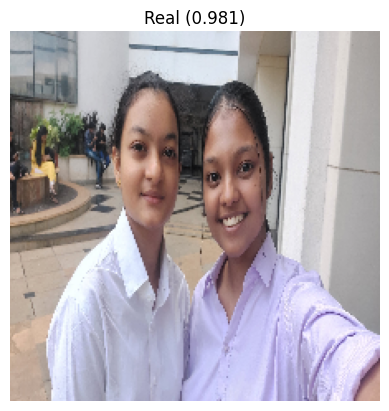


Final Prediction: Real
Confidence: 98.14 %


In [ ]:
predict_image("20231129_115139 (1).jpg")

In [ ]:
from google.colab import files
files.upload()

Saving download.jpeg to download.jpeg


{'download.jpeg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xdb\x00C\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xc2\x00\x11\x08\x04\x00\x04\x00\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1e\x00\x00\x02\x03\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x05\x04\x06\x03\x07\x02\x01\x08\x00\t\n\xff\xc4\x00\x1c\x01\x00\x03\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x03\x02\x04\x01\x05\x00\x06\x07\x08\xff\xda\x00\x0c\x03\x01\x00\x02\x10\x03\x10\x00\


Class Probabilities:
Fake: 1.1225902350506614e-15
Real: 9.34447519362891e-11
Synthetic: 1.0


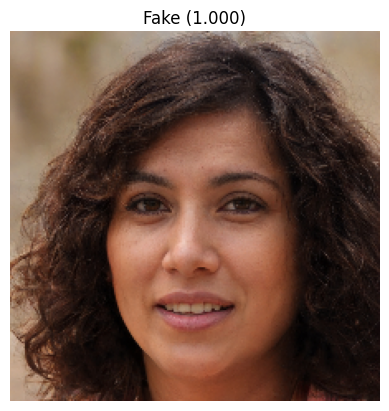


Final Prediction: Fake
Confidence: 100.0 %


In [ ]:
predict_image("download.jpeg")

In [ ]:
from google.colab import files
files.upload()

Saving nandini_img.jpg to nandini_img.jpg


{'nandini_img.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00`\x00`\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\x03\x03\x03\x03\x04\x03\x03\x04\x05\x08\x05\x05\x04\x04\x05\n\x07\x07\x06\x08\x0c\n\x0c\x0c\x0b\n\x0b\x0b\r\x0e\x12\x10\r\x0e\x11\x0e\x0b\x0b\x10\x16\x10\x11\x13\x14\x15\x15\x15\x0c\x0f\x17\x18\x16\x14\x18\x12\x14\x15\x14\xff\xdb\x00C\x01\x03\x04\x04\x05\x04\x05\t\x05\x05\t\x14\r\x0b\r\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\xff\xc0\x00\x11\x08\x01P\x00\xd6\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x


Class Probabilities:
Fake: 0.0034505899529904127
Real: 0.9710071086883545
Synthetic: 0.025542283430695534


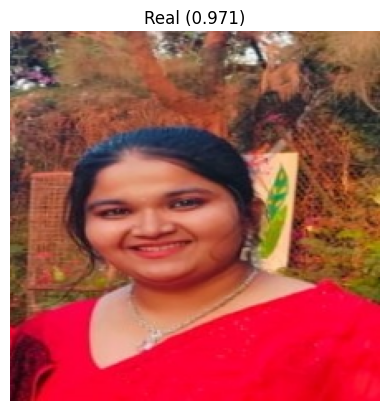


Final Prediction: Real
Confidence: 97.1 %


In [ ]:
predict_image("nandini_img.jpg")

In [ ]:
from google.colab import files
files.upload()

Saving fake_imgs.jpeg to fake_imgs.jpeg


{'fake_imgs.jpeg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xdb\x00C\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xc2\x00\x11\x08\x04\x00\x04\x00\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1d\x00\x00\x01\x05\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x05\x06\x04\x03\x07\x02\x01\x08\x00\t\xff\xc4\x00\x1c\x01\x00\x02\x03\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x00\x03\x04\x02\x05\x01\x00\x06\x07\x08\xff\xda\x00\x0c\x03\x01\x00\x02\x10\x03\x10\x00\x


Class Probabilities:
Fake: 2.2357013159182704e-13
Real: 1.583039299646316e-08
Synthetic: 1.0


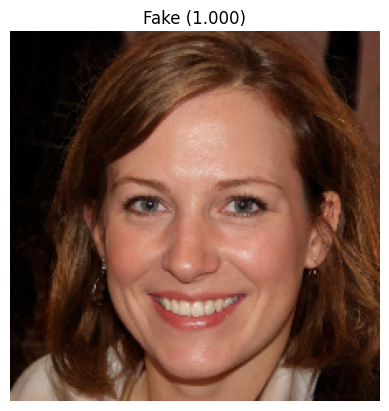


Final Prediction: Fake
Confidence: 100.0 %


In [ ]:
predict_image("fake_imgs.jpeg")

In [ ]:
from google.colab import files
files.upload()

Saving saloni_img.jpg to saloni_img.jpg


{'saloni_img.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x01\x00`\x00`\x00\x00\xff\xdb\x00C\x00\x03\x02\x02\x03\x02\x02\x03\x03\x03\x03\x04\x03\x03\x04\x05\x08\x05\x05\x04\x04\x05\n\x07\x07\x06\x08\x0c\n\x0c\x0c\x0b\n\x0b\x0b\r\x0e\x12\x10\r\x0e\x11\x0e\x0b\x0b\x10\x16\x10\x11\x13\x14\x15\x15\x15\x0c\x0f\x17\x18\x16\x14\x18\x12\x14\x15\x14\xff\xdb\x00C\x01\x03\x04\x04\x05\x04\x05\t\x05\x05\t\x14\r\x0b\r\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\x14\xff\xc0\x00\x11\x08\x01\x8f\x01\'\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x


Class Probabilities:
Fake: 0.012160565704107285
Real: 0.9691227078437805
Synthetic: 0.01871667429804802


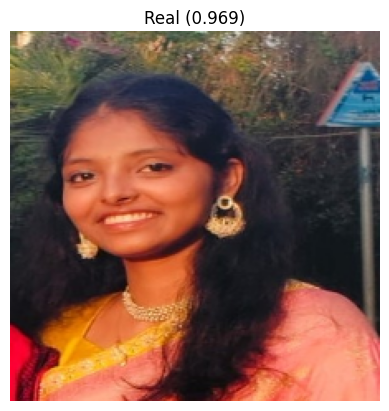


Final Prediction: Real
Confidence: 96.91 %


In [ ]:
predict_image("saloni_img.jpg")

#FINAL WORK

##Pipeline
Image -> Face Detection -> Face Crop -> Classifier

In [ ]:
import torch
import torchvision.models as models
import torch.nn as nn
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [ ]:
model = models.resnet18(weights=None)

model.fc = nn.Sequential(
    nn.Linear(512,256),
    nn.ReLU(),
    nn.Dropout(0.4),
    nn.Linear(256,3)
)

In [ ]:
model.load_state_dict(torch.load("/content/drive/MyDrive/DeepDetect/deepfake_checkpoints/best_resnet_model_3class.pth", map_location=device))
model = model.to(device)
model.eval()

print("Model loaded successfully")

Model loaded successfully


In [ ]:
test_transforms = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor()
])

In [ ]:
# Face detection Pipeline
face_detector = cv2.CascadeClassifier(
    cv2.data.haarcascades + "haarcascade_frontalface_default.xml"
)

In [ ]:
class_names = ["Fake","Real","Synthetic"]

def predict_image(image_path):

    image = cv2.imread(image_path)
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    faces = face_detector.detectMultiScale(gray,1.3,5)

    if len(faces) == 0:
        print("No face detected")
        return

    x,y,w,h = faces[0]

    face = rgb[y:y+h, x:x+w]
    face = cv2.resize(face,(224,224))

    input_tensor = test_transforms(Image.fromarray(face)).unsqueeze(0).to(device)

    with torch.no_grad():

        outputs = model(input_tensor)

        probs = torch.softmax(outputs,dim=1)

    fake_prob = probs[0][0].item() + probs[0][2].item()
    real_prob = probs[0][1].item()

    if real_prob > fake_prob:
        label = "Real"
        confidence = real_prob
    else:
        label = "Fake"
        confidence = fake_prob

    plt.imshow(face)
    plt.title(f"{label} ({confidence*100:.2f}%)")
    plt.axis("off")
    plt.show()

    print("Real probability:", round(real_prob*100,2),"%")
    print("Fake probability:", round(fake_prob*100,2),"%")

In [ ]:
from google.colab import files
files.upload()

Saving 01fake_img.jpeg to 01fake_img.jpeg


{'01fake_img.jpeg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xdb\x00C\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xc2\x00\x11\x08\x04\x00\x04\x00\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1e\x00\x00\x02\x03\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x05\x04\x06\x03\x07\x02\x01\x08\x00\t\n\xff\xc4\x00\x1c\x01\x00\x03\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x03\x02\x04\x01\x05\x00\x06\x07\x08\xff\xda\x00\x0c\x03\x01\x00\x02\x10\x03\x10\x0

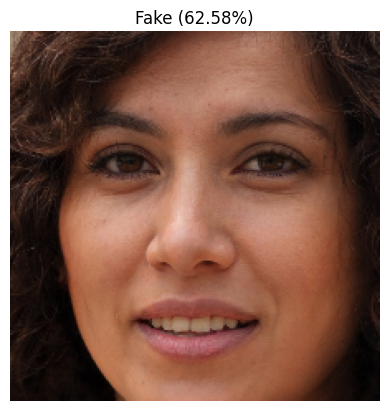

Real probability: 37.42 %
Fake probability: 62.58 %


In [ ]:
predict_image("01fake_img.jpeg")

#GardCam

##Pipeline
Face Image -> Model Prediction -> Gradients from -> last conv layer -> Heatmap -> Overlay on image

In [ ]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 79.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44285 sha256=6da06f9ee0a3159927643bd355a716451d338dc55d1091eca324be168a13f860
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


In [ ]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

In [ ]:
# Target layer
# Last convolution block
target_layers = [model.layer4[-1]]

In [ ]:
#Preparing image for GardCam
import numpy as np

def preprocess_image(image):

    image = cv2.resize(image,(224,224))

    rgb_img = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    input_tensor = test_transforms(Image.fromarray(rgb_img)).unsqueeze(0).to(device)

    rgb_float = np.float32(rgb_img)/255

    return input_tensor, rgb_float

In [ ]:
# Visualization function
def gradcam_visualization(image_path):

    image = cv2.imread(image_path)

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    faces = face_detector.detectMultiScale(gray,1.3,5)

    if len(faces)==0:
        print("No face detected")
        return

    x,y,w,h = faces[0]

    face = image[y:y+h, x:x+w]

    input_tensor, rgb_float = preprocess_image(face)

    cam = GradCAM(model=model, target_layers=target_layers)

    with torch.no_grad():
        outputs = model(input_tensor)

    probs = torch.softmax(outputs,dim=1)

    class_id = torch.argmax(probs).item()

    grayscale_cam = cam(input_tensor=input_tensor)[0]

    visualization = show_cam_on_image(rgb_float, grayscale_cam, use_rgb=True)

    plt.figure(figsize=(8,4))

    plt.subplot(1,2,1)
    plt.imshow(rgb_float)
    plt.title("Input Face")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(visualization)
    plt.title("GradCAM Heatmap")
    plt.axis("off")

    plt.show()

    print("Fake probability:",
          round((probs[0][0]+probs[0][2]).item()*100,2),"%")

    print("Real probability:",
          round(probs[0][1].item()*100,2),"%")

In [ ]:
from google.colab import files
files.upload()

Saving 01fake_img.jpeg to 01fake_img (1).jpeg


{'01fake_img (1).jpeg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xdb\x00C\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xc2\x00\x11\x08\x04\x00\x04\x00\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1e\x00\x00\x02\x03\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x05\x04\x06\x03\x07\x02\x01\x08\x00\t\n\xff\xc4\x00\x1c\x01\x00\x03\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x03\x02\x04\x01\x05\x00\x06\x07\x08\xff\xda\x00\x0c\x03\x01\x00\x02\x10\x03\x1

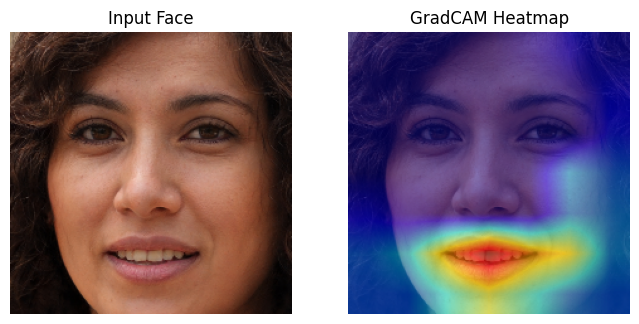

Fake probability: 62.58 %
Real probability: 37.42 %


In [ ]:
gradcam_visualization("01fake_img (1).jpeg")

#Robustness

## Pipeline
Image -> Apply distortion -> Run deepfake detector -> Compare prediction

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [ ]:
# Create Image Distortions
def apply_distortions(image):

    distortions = {}

    distortions["Original"] = image

    distortions["Gaussian Blur"] = cv2.GaussianBlur(image,(11,11),0)

    noise = np.random.normal(0,25,image.shape).astype(np.uint8)
    distortions["Noise"] = cv2.add(image,noise)

    distortions["Low Resolution"] = cv2.resize(
        cv2.resize(image,(64,64)),
        (224,224)
    )

    encode_param = [int(cv2.IMWRITE_JPEG_QUALITY),30]
    result, encimg = cv2.imencode('.jpg',image,encode_param)
    distortions["JPEG Compression"] = cv2.imdecode(encimg,1)

    return distortions

In [ ]:
# Prediction Function
def predict_face(face):

    input_tensor = test_transforms(
        Image.fromarray(face)
    ).unsqueeze(0).to(device)

    with torch.no_grad():

        outputs = model(input_tensor)

        probs = torch.softmax(outputs,dim=1)

    fake_prob = probs[0][0].item() + probs[0][2].item()
    real_prob = probs[0][1].item()

    if real_prob > fake_prob:
        label = "Real"
        confidence = real_prob
    else:
        label = "Fake"
        confidence = fake_prob

    return label, confidence

In [ ]:
# Robustness test
def robustness_test(image_path):

    image = cv2.imread(image_path)

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    faces = face_detector.detectMultiScale(gray,1.3,5)

    if len(faces)==0:
        print("No face detected")
        return

    x,y,w,h = faces[0]

    face = image[y:y+h,x:x+w]
    face = cv2.resize(face,(224,224))

    distortions = apply_distortions(face)

    plt.figure(figsize=(15,8))

    i = 1

    for name,img in distortions.items():

        label,conf = predict_face(img)

        plt.subplot(2,3,i)

        plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

        plt.title(f"{name}\n{label} ({conf*100:.1f}%)")

        plt.axis("off")

        i+=1

    plt.show()

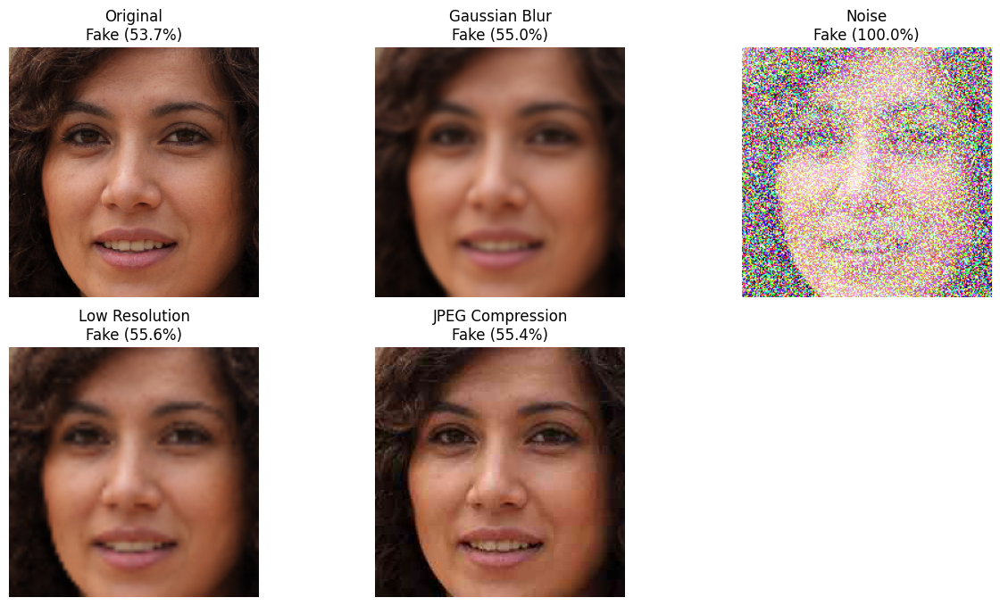

In [ ]:
robustness_test("01fake_img (1).jpeg")

# Fast Fourier Transform (FFT)

## Pipeline
Image -> Face Detection -> Face Crop -> RGB + FFT features -> Classifier

In [ ]:
# Convert image to FFT Spectrum
import numpy as np
import cv2

def compute_fft(image):

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    f = np.fft.fft2(gray)

    fshift = np.fft.fftshift(f)

    magnitude_spectrum = 20*np.log(np.abs(fshift)+1)

    magnitude_spectrum = cv2.normalize(
        magnitude_spectrum,
        None,
        0,
        255,
        cv2.NORM_MINMAX
    )

    return magnitude_spectrum.astype(np.uint8)

In [ ]:
# Visualize FFT vs Original
def show_fft(image_path):

    image = cv2.imread(image_path)

    fft_img = compute_fft(image)

    plt.figure(figsize=(10,4))

    plt.subplot(1,2,1)
    plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(fft_img,cmap="gray")
    plt.title("FFT Spectrum")
    plt.axis("off")

    plt.show()

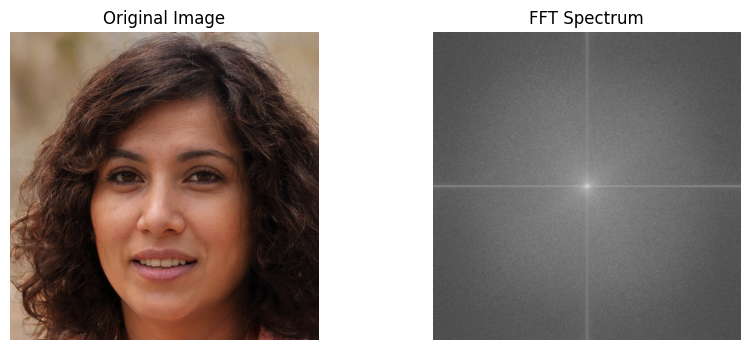

In [ ]:
show_fft("01fake_img (1).jpeg")